# XGBoost regression
[Code Review 3](https://www.kaggle.com/code/sharanharsoor/eda-and-xgboost-regression-for-each-store/notebook)


# Settings

## Import modules

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session
import seaborn as sns
import matplotlib.pyplot as plt
pd.options.display.float_format = '{:.2f}'.format

## Load Data

In [47]:
path = '/content/drive/MyDrive/kaggle/store-sales-time-series-forecasting/'

train_df = pd.read_csv(path+'train.csv')
test_df = pd.read_csv(path+'test.csv')
oil_df = pd.read_csv(path+'oil.csv')
sample_df = pd.read_csv(path+'sample_submission.csv')
hol_df = pd.read_csv(path+'holidays_events.csv')
store_df =  pd.read_csv(path+'stores.csv')
tr_df = pd.read_csv(path+'transactions.csv')

# Data Analysis & EDA

## Data Analysis

### Train Data Analysis
- Train data 데이터 분석하기

In [4]:
# sales가 있는 날짜에서 train data 살펴보기
#initial look at training data form and count of rows, columns, type of data etc
train_df[train_df.sales>0]

,date,store_nbr,family,sales,onpromotion
id,,,,,
563,2013-01-01,25,BEAUTY,2.00,0
564,2013-01-01,25,BEVERAGES,810.00,0
566,2013-01-01,25,BREAD/BAKERY,180.59,0
568,2013-01-01,25,CLEANING,186.00,0
569,2013-01-01,25,DAIRY,143.00,0
...,...,...,...,...,...
3000883,2017-08-15,9,POULTRY,438.13,0
3000884,2017-08-15,9,PREPARED FOODS,154.55,1
3000885,2017-08-15,9,PRODUCE,2419.73,148


In [5]:
# store 확인
# total number of unique stores 
np.sort(train_df.store_nbr.unique())

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
       35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51,
       52, 53, 54])

In [6]:
# 제품 종류 확인
# unique family of items
train_df.family.unique()

array(['AUTOMOTIVE', 'BABY CARE', 'BEAUTY', 'BEVERAGES', 'BOOKS',
       'BREAD/BAKERY', 'CELEBRATION', 'CLEANING', 'DAIRY', 'DELI', 'EGGS',
       'FROZEN FOODS', 'GROCERY I', 'GROCERY II', 'HARDWARE',
       'HOME AND KITCHEN I', 'HOME AND KITCHEN II', 'HOME APPLIANCES',
       'HOME CARE', 'LADIESWEAR', 'LAWN AND GARDEN', 'LINGERIE',
       'LIQUOR,WINE,BEER', 'MAGAZINES', 'MEATS', 'PERSONAL CARE',
       'PET SUPPLIES', 'PLAYERS AND ELECTRONICS', 'POULTRY',
       'PREPARED FOODS', 'PRODUCE', 'SCHOOL AND OFFICE SUPPLIES',
       'SEAFOOD'], dtype=object)

In [7]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3000888 entries, 0 to 3000887
Data columns (total 5 columns):
 #   Column       Dtype  
---  ------       -----  
 0   date         object 
 1   store_nbr    int64  
 2   family       object 
 3   sales        float64
 4   onpromotion  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 137.4+ MB


In [8]:
train_df.describe()

,store_nbr,sales,onpromotion
count,3000888.00,3000888.00,3000888.00
mean,27.50,357.78,2.60
std,15.59,1102.00,12.22
min,1.00,0.00,0.00
25%,14.00,0.00,0.00
50%,27.50,11.00,0.00
75%,41.00,195.85,0.00
max,54.00,124717.00,741.00


## EDA

### Store & Sales
- Store 별 sales 시각화하기
- 날짜 중심

In [9]:
# store 별 평균 sales 확인
# to know how the each store have done the business
train_df.groupby(by='store_nbr')['sales'].sum()

store_nbr
1    14145012.87
2    21557388.64
3    50481910.19
4    18909700.38
5    15592404.57
6    25183680.00
7    26952049.58
8    30494286.93
9    26409441.06
10    9613905.74
11   28325558.48
12   10659217.96
13   10523045.82
14   11387918.75
15   11451270.02
16   10986412.55
17   18030969.25
18   13259375.69
19   13049509.84
20   12920954.59
21    9255505.91
22    4090201.74
23   11651380.67
24   23767732.70
25   11420997.87
26    7755121.89
27   19188021.38
28   18383154.83
29    9725157.70
30    7382073.66
31   17746872.70
32    5951796.00
33   14178501.29
34   17090734.16
35    7676679.42
36   15322431.10
37   19970635.61
38   18859999.26
39   20252192.53
40   18395757.41
41   14991039.14
42    8945767.89
43   16391692.21
44   62087553.25
45   54498010.42
46   41896062.12
47   50948310.06
48   35933130.27
49   43420095.78
50   28653020.62
51   32911489.54
52    2696169.73
53   11216167.28
54   11057483.12
Name: sales, dtype: float64

In [10]:
# 날짜별 store 별 평균 sales 비교
#visual of of the store sales plot, we can clearly see once there are some outliers (huge sales on few days)
import plotly.express as px
fig = px.scatter(train_df[train_df.store_nbr==1], x="date", y="sales")
fig.show()

In [11]:
# 날짜별, 달별, 년별 date 나누기
#deving date form to different forms of month, year, day for future analysis

train_df['month'] = pd.to_datetime(train_df['date']).dt.month
train_df['day'] = pd.to_datetime(train_df['date']).dt.day
train_df['day_name'] = pd.to_datetime(train_df['date']).dt.day_name()
train_df['year'] = pd.to_datetime(train_df['date']).dt.year
train_df.head(1)

,date,store_nbr,family,sales,onpromotion,month,day,day_name,year
id,,,,,,,,,
0,2013-01-01,1,AUTOMOTIVE,0.00,0,1,1,Tuesday,2013


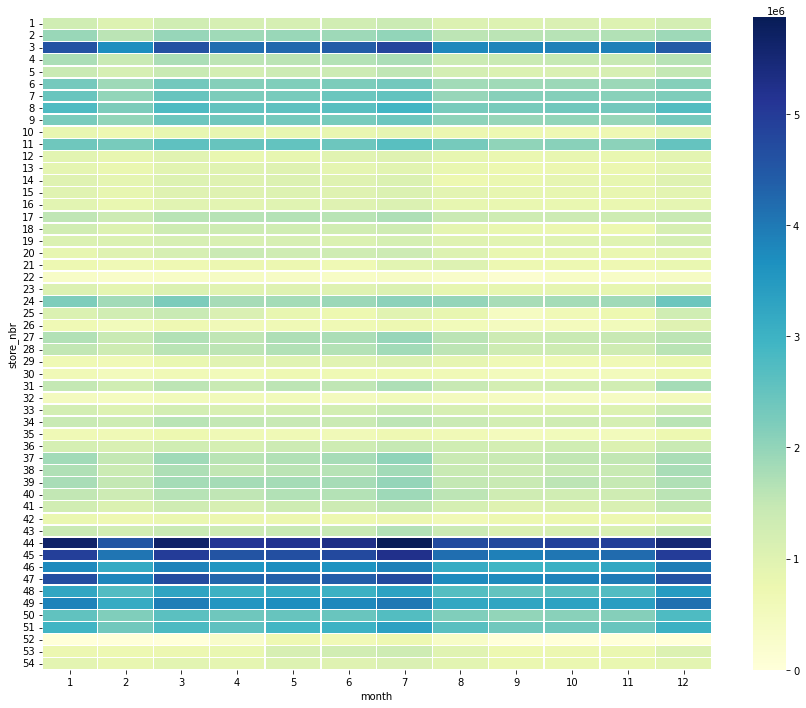

In [12]:
# 달별 store 별 평균 sales 비교
# check the sales across the months to understand the pattern. In this case we clearly 
# don't see gradual increase of sales for any stores over time. more or less all stores 
# are doing same business  from previous months

table = pd.pivot_table(train_df, values ='sales', index =['store_nbr'],
                         columns =['month'], aggfunc = np.sum)
fig, ax = plt.subplots(figsize=(15,12))         
sns.heatmap(table, annot=False, linewidths=.5, ax=ax, cmap="YlGnBu")
plt.show()

**Output**

어떤 날짜(혹은 달)에 어떤 store에서 sales가 가장 많았는지 확인할 수 있었다.

### Family & Sales
- 제품별 sales 시각화하기
- sales 중심

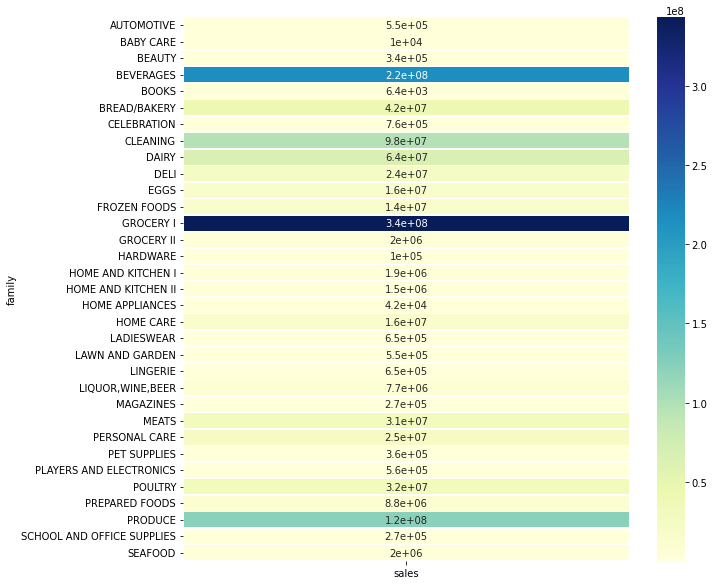

In [13]:
# 제품별 sales 비교
# check how the different family is impacting the sales, clearly here we have a pattern here, we will use 
# this information later for feature engineering. 

table1 = pd.pivot_table(train_df, values ='sales', index =['family'], aggfunc = np.sum)
fig, ax = plt.subplots(figsize=(10,10))         
sns.heatmap(table1, annot=True, linewidths=.5, ax=ax, cmap="YlGnBu")
plt.show()

In [14]:
# 제품별 총 sales에서 차지하는 비율 확인
# percentage of sales contributed by each family 

total_sum = table1.sales.sum()
table1/total_sum

,sales
family,
AUTOMOTIVE,0.00
BABY CARE,0.00
BEAUTY,0.00
BEVERAGES,0.20
BOOKS,0.00
BREAD/BAKERY,0.04
CELEBRATION,0.00
CLEANING,0.09
DAIRY,0.06


**Output**

어떤 제품에서 sales가 가장 많았는지 확인할 수 있었다.

### Store 1 & Store 2
- 2개의 Store에서 진행되는 promotion 비교
- sales 중심

In [15]:
# taking two stores [1 and 2] for checking the impact of promotion on sales.
# clearly there is a week bound between sales and promotion. 
import plotly.express as px
fig = px.scatter(train_df[train_df.store_nbr==1], x="onpromotion", y="sales")
fig.show()

In [16]:
import plotly.express as px
fig = px.scatter(train_df[train_df.store_nbr==2], x="onpromotion", y="sales")
fig.show()

In [17]:
# total sales with and without promotion, because of huge data 
# withoug promotion, this graph isn't helping for analysis
import plotly.express as px
df = px.data.tips()
fig = px.histogram(train_df[train_df.onpromotion<200], x="onpromotion", nbins=20)
fig.show()

### Sales
- 날짜별 sales 시각화하기
- 날짜 중심

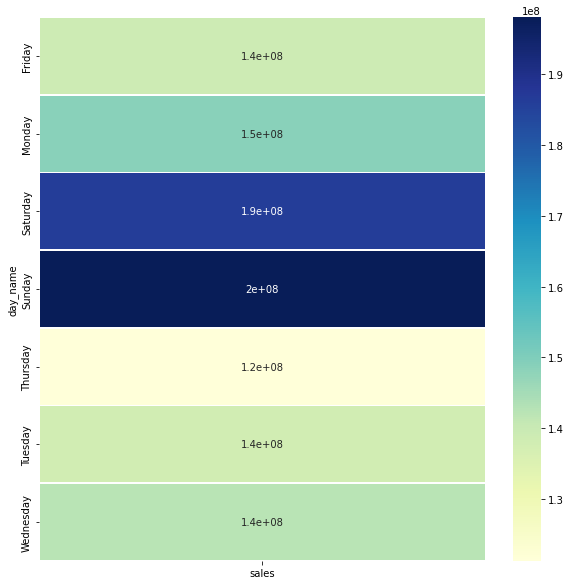

In [18]:
# 요일별 sales 비교
# checking if any day of the week have impact on sales, clearly we can see weekend sales is always high
# will use this information for feature engineering.

table3 = pd.pivot_table(train_df, values ='sales', index =['day_name'], aggfunc = np.sum)
fig, ax = plt.subplots(figsize=(10,10))         
sns.heatmap(table3, annot=True, linewidths=.5, ax=ax, cmap="YlGnBu")
plt.show()

**Output**

주말에 sales가 많다는 것을 알 수 있었다.

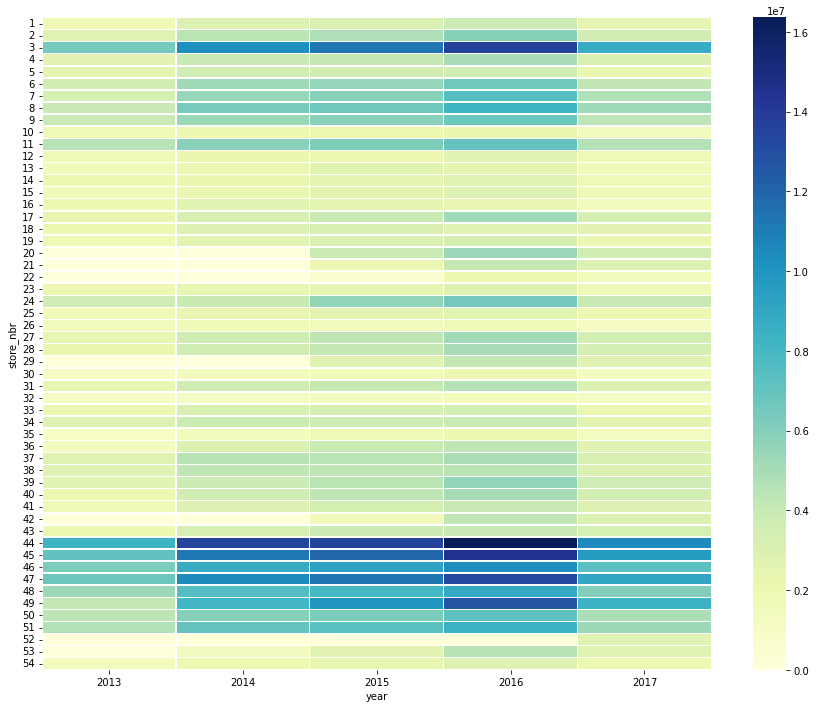

In [19]:
# 년도별 sales 비교
# checking if the sales year have any impact, there is a weak co-relation with year and sales.  
table_year = pd.pivot_table(train_df, values ='sales', index =['store_nbr'],
                         columns =['year'], aggfunc = np.sum)

fig, ax = plt.subplots(figsize=(15,12))         
sns.heatmap(table_year, annot=False, linewidths=.5, ax=ax, cmap="YlGnBu")
plt.show()

**Output**

2016년에 전반적으로 store 별 sales가 많았다는 것을 알 수 있었다.

# Data Preprocessing
- 이상치 제거

In [21]:
# 제품 합치기
# from analysis it was seen that few members sales was high, depending upon sales proportion 
# making the groups for family

family_map       = {'AUTOMOTIVE': 'rest',
                   'BABY CARE': 'rest',
                   'BEAUTY': 'rest',
                   'BOOKS': 'rest',
                   'CELEBRATION': 'rest',
                   'GROCERY II': 'rest',
                   'HARDWARE': 'rest',
                   'HOME AND KITCHEN I': 'rest',
                   'HOME AND KITCHEN II': 'rest',
                   'HOME APPLIANCES': 'rest',
                   'LADIESWEAR': 'rest',
                   'LAWN AND GARDEN': 'rest',
                   'LINGERIE': 'rest',
                   'MAGAZINES': 'rest',
                   'PET SUPPLIES': 'rest',
                   'PLAYERS AND ELECTRONICS': 'rest',
                   'SCHOOL AND OFFICE SUPPLIES': 'rest',
                   'SEAFOOD': 'rest',
                   'DELI': 'first_sec',
                    'EGGS': 'first_sec',
                    'FROZEN FOODS': 'first_sec',
                    'HOME CARE': 'first_sec',
                    'LIQUOR,WINE,BEER': 'first_sec',
                    'PREPARED FOODS': 'first_sec',
                    'PERSONAL CARE': 'first_sec',
                    'BREAD/BAKERY': 'third',
                    'MEATS': 'third',
                    'POULTRY': 'third',
                    'CLEANING':'fourth',
                    'DAIRY':'fourth',
                    'PRODUCE':'seventh',
                    'BEVERAGES':'fifth',
                    'GROCERY I': 'sixth'
                   }

train_df['new_family'] = train_df['family'].map(family_map)
train_df.head(10)


,date,store_nbr,family,sales,onpromotion,month,day,day_name,year,new_family
id,,,,,,,,,,
0,2013-01-01,1,AUTOMOTIVE,0.00,0,1,1,Tuesday,2013,rest
1,2013-01-01,1,BABY CARE,0.00,0,1,1,Tuesday,2013,rest
2,2013-01-01,1,BEAUTY,0.00,0,1,1,Tuesday,2013,rest
3,2013-01-01,1,BEVERAGES,0.00,0,1,1,Tuesday,2013,fifth
4,2013-01-01,1,BOOKS,0.00,0,1,1,Tuesday,2013,rest
5,2013-01-01,1,BREAD/BAKERY,0.00,0,1,1,Tuesday,2013,third
6,2013-01-01,1,CELEBRATION,0.00,0,1,1,Tuesday,2013,rest
7,2013-01-01,1,CLEANING,0.00,0,1,1,Tuesday,2013,fourth
8,2013-01-01,1,DAIRY,0.00,0,1,1,Tuesday,2013,fourth


In [22]:
# 이상치 확인
# graph for before handling the oulier 
import plotly.express as px
fig = px.scatter(train_df[train_df.store_nbr==4], x="date", y="sales")
fig.show()

In [23]:
# store 별 이상치 확인
# handling the ouliers for each store

for i in range(1,len(train_df.store_nbr.unique())+1):
    val = train_df[train_df.store_nbr == i].sales.quantile(0.99)
    train_df = train_df.drop(train_df[(train_df.store_nbr==i) & (train_df.sales > val)].index)

In [24]:
# 이상치 제거 후 시각화
# after handling the ouliers
# after removing the outlier columns we will loose nealry 1% of the total rows for all the stores.
fig = px.scatter(train_df[train_df.store_nbr==4], x="date", y="sales")
fig.show()

# Other Data Analysis
- train data 외 다른 데이터 확인

## Store Data

In [25]:
store_df.shape

(54, 5)

In [26]:
# merging the store data with training data
train_df = pd.merge(train_df, store_df, on='store_nbr', how='left') 
train_df.head(3)

,date,store_nbr,family,sales,onpromotion,month,day,day_name,year,new_family,city,state,type,cluster
0,2013-01-01,1,AUTOMOTIVE,0.00,0,1,1,Tuesday,2013,rest,Quito,Pichincha,D,13
1,2013-01-01,1,BABY CARE,0.00,0,1,1,Tuesday,2013,rest,Quito,Pichincha,D,13
2,2013-01-01,1,BEAUTY,0.00,0,1,1,Tuesday,2013,rest,Quito,Pichincha,D,13


In [30]:
# unique city data
store_df.city.unique()

array(['Quito', 'Santo Domingo', 'Cayambe', 'Latacunga', 'Riobamba',
       'Ibarra', 'Guaranda', 'Puyo', 'Ambato', 'Guayaquil', 'Salinas',
       'Daule', 'Babahoyo', 'Quevedo', 'Playas', 'Libertad', 'Cuenca',
       'Loja', 'Machala', 'Esmeraldas', 'Manta', 'El Carmen'],
      dtype=object)

In [31]:
store_df.state.unique()

array(['Pichincha', 'Santo Domingo de los Tsachilas', 'Cotopaxi',
       'Chimborazo', 'Imbabura', 'Bolivar', 'Pastaza', 'Tungurahua',
       'Guayas', 'Santa Elena', 'Los Rios', 'Azuay', 'Loja', 'El Oro',
       'Esmeraldas', 'Manabi'], dtype=object)

## Holiday Data

In [27]:
#holiday data
hol_df.head(2)

,date,type,locale,locale_name,description,transferred
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False
1,2012-04-01,Holiday,Regional,Cotopaxi,Provincializacion de Cotopaxi,False


In [28]:
# types of holidays
hol_df.locale.unique()

array(['Local', 'Regional', 'National'], dtype=object)

In [29]:
# unique local names (this info combining with store meta data will help in merging with trining data)
hol_df.locale_name.unique()

array(['Manta', 'Cotopaxi', 'Cuenca', 'Libertad', 'Riobamba', 'Puyo',
       'Guaranda', 'Imbabura', 'Latacunga', 'Machala', 'Santo Domingo',
       'El Carmen', 'Cayambe', 'Esmeraldas', 'Ecuador', 'Ambato',
       'Ibarra', 'Quevedo', 'Santo Domingo de los Tsachilas',
       'Santa Elena', 'Quito', 'Loja', 'Salinas', 'Guayaquil'],
      dtype=object)

In [32]:
hol_df.type.unique()

array(['Holiday', 'Transfer', 'Additional', 'Bridge', 'Work Day', 'Event'],
      dtype=object)

In [33]:
# renaming a column, since tranining data also has a column 'type' helps for clear merge.
hol_df.rename(columns={'type': 'day_nature'},
          inplace=True, errors='raise')

In [34]:
# only 1 national name Ecuador
hol_df[hol_df.locale=='National'].head(3)

,date,day_nature,locale,locale_name,description,transferred
14,2012-08-10,Holiday,National,Ecuador,Primer Grito de Independencia,False
19,2012-10-09,Holiday,National,Ecuador,Independencia de Guayaquil,True
20,2012-10-12,Transfer,National,Ecuador,Traslado Independencia de Guayaquil,False


In [35]:
# creating different data frames with different holidays to merge
holiday_loc = hol_df[hol_df.locale == 'Local']
holiday_reg = hol_df[hol_df.locale == 'Regional']
holiday_nat = hol_df[hol_df.locale == 'National']

In [36]:
holiday_loc.rename(columns={'locale_name': 'city'},
          inplace=True, errors='raise')
holiday_reg.rename(columns={'locale_name': 'state'},
          inplace=True, errors='raise')

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:5047: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [37]:
holiday_loc

,date,day_nature,locale,city,description,transferred
0,2012-03-02,Holiday,Local,Manta,Fundacion de Manta,False
2,2012-04-12,Holiday,Local,Cuenca,Fundacion de Cuenca,False
3,2012-04-14,Holiday,Local,Libertad,Cantonizacion de Libertad,False
4,2012-04-21,Holiday,Local,Riobamba,Cantonizacion de Riobamba,False
5,2012-05-12,Holiday,Local,Puyo,Cantonizacion del Puyo,False
...,...,...,...,...,...,...
339,2017-12-05,Additional,Local,Quito,Fundacion de Quito-1,False
340,2017-12-06,Holiday,Local,Quito,Fundacion de Quito,True
341,2017-12-08,Holiday,Local,Loja,Fundacion de Loja,False
342,2017-12-08,Transfer,Local,Quito,Traslado Fundacion de Quito,False


## Merge with Train Data
- 결과를 train data와 합치기

In [38]:
train_df = pd.merge(train_df, holiday_loc, on=['date', 'city'], how='left') 
train_df = train_df[~((train_df.day_nature == 'Holiday') & (train_df.transferred == False))]
train_df.drop(['day_nature', 'locale', 'description','transferred'], axis=1, inplace=True)
train_df = pd.merge(train_df, holiday_reg, on=['date', 'state'], how='left') 
train_df = train_df[~((train_df.day_nature == 'Holiday') & (train_df.transferred == False))]
train_df.drop(['day_nature', 'locale', 'description','transferred'], axis=1, inplace=True)
train_df = pd.merge(train_df, holiday_nat, on=['date'], how='left') 
train_df = train_df[~((train_df.day_nature == 'Holiday') & (train_df.transferred == False))]
train_df.drop(['day_nature', 'locale', 'description','transferred'], axis=1, inplace=True)

In [40]:
train_df.drop(['date', 'family', 'month', 'day','city','state','type', 'cluster', 'locale_name', 'year'],axis=1, inplace=True)

In [41]:
train_df = pd.get_dummies(train_df, columns = ['day_name','new_family'])
train_df.reset_index(inplace=True)
train_df.drop(['index'],axis=1, inplace=True)
train_df.head(2)

,store_nbr,sales,onpromotion,day_name_Friday,day_name_Monday,day_name_Saturday,day_name_Sunday,day_name_Thursday,day_name_Tuesday,day_name_Wednesday,new_family_fifth,new_family_first_sec,new_family_fourth,new_family_rest,new_family_seventh,new_family_sixth,new_family_third
0,1,2.00,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0
1,1,0.00,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0


# Modeling

## Data Analysis

## Train Model

In [ ]:
# 모델 정의
from sklearn.linear_model import LinearRegression
from xgboost import XGBRegressor
from sklearn import preprocessing


for i in range(1,len(train_df.store_nbr.unique())+1):  
    temp_df = train_df[train_df.store_nbr == i]
    sale_out = temp_df[['sales']]
    globals()['max_%s' % i] = temp_df['onpromotion'].max()
    temp_df['onpromotion'] = (temp_df['onpromotion']/globals()['max_%s' % i])
    temp_df.onpromotion = np.where(temp_df.onpromotion<0, 0, temp_df.onpromotion)
    temp_df.drop(['sales','store_nbr'],axis=1, inplace=True)
    globals()['model_%s' % i] = XGBRegressor(verbosity=0)
    globals()['model_%s' % i].fit(temp_df, sale_out)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/pandas/core/generic.py:5516: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4913: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-ver

In [43]:
test_df['day_name'] = pd.to_datetime(test_df['date']).dt.day_name()
test_df['new_family'] = test_df['family'].map(family_map)
test_df.drop(['date','family'],axis=1, inplace=True)
test_df = pd.get_dummies(test_df, columns = ['day_name','new_family'])
test_df.head(2)

,store_nbr,onpromotion,day_name_Friday,day_name_Monday,day_name_Saturday,day_name_Sunday,day_name_Thursday,day_name_Tuesday,day_name_Wednesday,new_family_fifth,new_family_first_sec,new_family_fourth,new_family_rest,new_family_seventh,new_family_sixth,new_family_third
id,,,,,,,,,,,,,,,,
3000888,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0
3000889,1,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0


# Total Review

- **XGBoost Regression**을 사용했으므로, 분류기의 성능을 높이기위해 데이터 분석과 시각화를 철저히 진행했다.
- `pd.pivot_table`을 사용하여 유의미한 시각화 결과를 도출했다.